In [1]:
import numpy as np 
import math
import os, glob
import matplotlib.pyplot as plt 
import matplotlib.gridspec as gridspec
from matplotlib.pyplot import figure
import coronagraph as cg
from astropy.io import ascii 
import matplotlib.font_manager as font_manager

os.chdir('/Users/schuylerraeschroerborges/Desktop/Second_Project/')

In [2]:
#Earth water vapor atmosphere
data1=ascii.read("Arthro_clearSky_mon_toa.rad", data_start=0, delimiter='\s')
data2=ascii.read("Arthro_clearSky_scrubbed_updated_mon_toa.rad", data_start=0, delimiter='\s')
data3=ascii.read("Arthro_lowcloud_um_mon_toa.rad",data_start=0, delimiter='\s')
data4=ascii.read("arthro_scrub_lowcloud_um_toa_new.rad",data_start=0, delimiter='\s')
data5=ascii.read("Arthro_highcloud_um_toa.rad",data_start=0, delimiter='\s')
data6=ascii.read("Arthro_scrubbed_highcloud_um_toa_new.rad",data_start=0, delimiter='\s')
data7=ascii.read("Ecto_clearSky_new_toa.rad", data_start=0, delimiter='\s')
data8=ascii.read("Ectoth_clearSky_scrubbed_mon_toa.rad", data_start=0, delimiter='\s')
data9=ascii.read("Ectoth_lowcloud_um_mon_toa.rad", data_start=0, delimiter='\s')
data10=ascii.read("Ectoth_pigment_um_lowcloud__mon_toa.rad", data_start=0, delimiter='\s')
data11=ascii.read("Ectoth_highcloud_um_toa.rad", data_start=0, delimiter='\s')
data12=ascii.read("Ectoth_scrubbed_highcloud_um_toa.rad", data_start=0, delimiter='\s')
data13=ascii.read("black_clearSky_mon_toa.rad", data_start=0, delimiter='\s')
data14=ascii.read("black_clearSky_scrubbed_mon_toa.rad", data_start=0, delimiter='\s')
data15=ascii.read("black_lowcloud_um_toa.rad", data_start=0, delimiter='\s')
data16=ascii.read("black_scrubbed_lowcloud_um_mon_toa.rad", data_start=0, delimiter='\s')
data17=ascii.read("blackmat_highcloud_um_toa.rad", data_start=0, delimiter='\s')
data18=ascii.read("blackmat_scrubbed_highcloud_um_toa.rad", data_start=0, delimiter='\s')
data19=ascii.read("orangemat_clearSky_mon_toa.rad", data_start=0, delimiter='\s')
data20=ascii.read("orangemat_clearSky_scrubbed_mon_toa.rad", data_start=0, delimiter='\s')
data21=ascii.read("orangemat_lowcloud_um_mon_toa.rad", data_start=0, delimiter='\s')
data22=ascii.read("orangemat_scrubbed_lowcloud_um_mon_toa.rad", data_start=0, delimiter='\s')
data23=ascii.read("orangemat_highcloud_um_toa.rad", data_start=0, delimiter='\s')
data24=ascii.read("orangemat_scrubbed_highcloud_um_toa.rad", data_start=0, delimiter='\s')

#Low water vapor in atmosphere case
data25=ascii.read("Arthro_clearSky_low_water_mon_toa.rad", data_start=0, delimiter='\s')
data26=ascii.read("Arthro_clearSky_low_water_scrubbed_mon_toa.rad", data_start=0, delimiter='\s')
data27=ascii.read("black_clearSky_low_water_mon_toa.rad", data_start=0, delimiter='\s')
data28=ascii.read("black_clearSky_low_water_scrubbed_mon_toa.rad", data_start=0, delimiter='\s')
data29=ascii.read("Ectoth_um_clearSky_low_water_mon_toa.rad", data_start=0, delimiter='\s')
data30=ascii.read("Ectoth_um_clearSky_scrubbed_low_water_mon_toa.rad", data_start=0, delimiter='\s')
data31=ascii.read("orange_clearsky_low_water_mon_toa.rad", data_start=0, delimiter='\s')
data32=ascii.read("orange_scrubbed_clearSky_low_water_mon_toa.rad", data_start=0, delimiter='\s')

black=ascii.read("bestblackmat.txt", data_start=1, delimiter='\s')
bscrub=ascii.read("black_scrubbed.txt", data_start=0, delimiter='\s')
orange=ascii.read("bestorangemat.txt", data_start=1, delimiter='\s')
oscrub=ascii.read("orangemat_scrubbed.txt", data_start=0, delimiter='\s')
arthro=ascii.read("Arthrobacter.txt", data_start=0, delimiter='\s')
ascrub=ascii.read("Arthro_pigment_scrub.txt", data_start=0, delimiter='\s')
ecto=ascii.read("Ectothiorhodospira.txt", data_start=0, delimiter='\s')
escrub=ascii.read("Ectoth_pigment_scrub.txt", data_start=0, delimiter='\s')

wavelength=black['Wavelength']*10**(-3)

# NEW ARTHROBACTER SPECTRA
data33=ascii.read("Arthro_lowcloud_scrub_v3_um_toa.rad", data_start=0, delimiter='\s')
data34=ascii.read("Arthro_highcloud_scrub_v3_um_toa.rad", data_start=0, delimiter='\s')
data35=ascii.read("Arthro_clearSky_scrub_v3_um_toa.rad", data_start=0, delimiter='\s')
data36=ascii.read("Arthro_scrubbed_v3_clearSky_new_lowh2o_toa.rad", data_start=0, delimiter='\s')

In [3]:
def reflectance(data):
    columnone=[]
    columnfour=[]
    columnthree=[]
    for i in range (0,len(data)):
        columnone.append(float(data[i][0]))
        columnfour.append(float(data[i][3]))
        columnthree.append(float(data[i][2]))
        
    o=np.array(columnone)
    f=np.array(columnfour)
    t=np.array(columnthree)
    
    reflectance=f/t
    wavelength=o
    
    return np.array([wavelength,reflectance])

#Earth water vapor atmosphere
arthro_clear = reflectance(data1)
ascrub_clear = reflectance(data2)
arthro_low = reflectance(data3)
ascrub_low = reflectance(data4)
arthro_high = reflectance(data5)
ascrub_high = reflectance(data6)
ecto_clear = reflectance(data7)
escrub_clear = reflectance(data8)
ecto_low = reflectance(data9)
escrub_low = reflectance(data10)
ecto_high = reflectance(data11)
escrub_high = reflectance(data12)
black_clear = reflectance(data13)
bscrub_clear = reflectance(data14)
black_low = reflectance(data15)
bscrub_low = reflectance(data16)
black_high = reflectance(data17)
bscrub_high = reflectance(data18)
orange_clear = reflectance(data19)
oscrub_clear = reflectance(data20)
orange_low = reflectance(data21)
oscrub_low = reflectance(data22)
orange_high = reflectance(data23)
oscrub_high = reflectance(data24)

#Low cloud cover
arthro_lowh2o = reflectance(data25)
ascrub_lowh2o = reflectance(data26)
black_lowh2o = reflectance(data27)
bscrub_lowh2o = reflectance(data28)
ecto_lowh2o = reflectance(data29)
escrub_lowh2o = reflectance(data30)
orange_lowh2o = reflectance(data31)
oscrub_lowh2o = reflectance(data32)

ascrub_2_lowh2o = reflectance(data36)

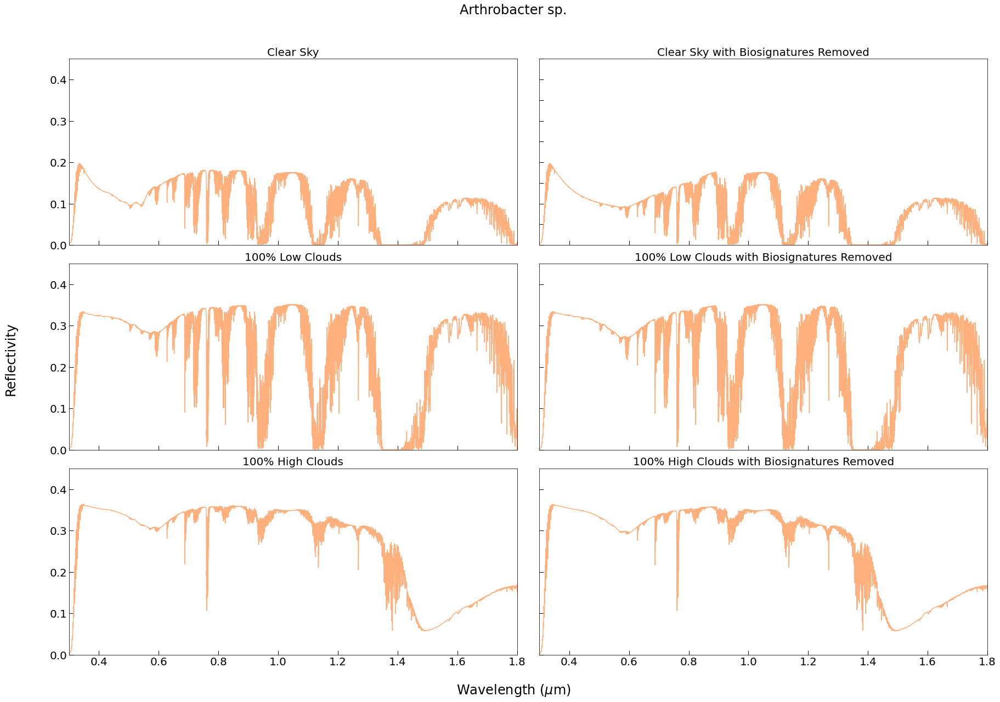

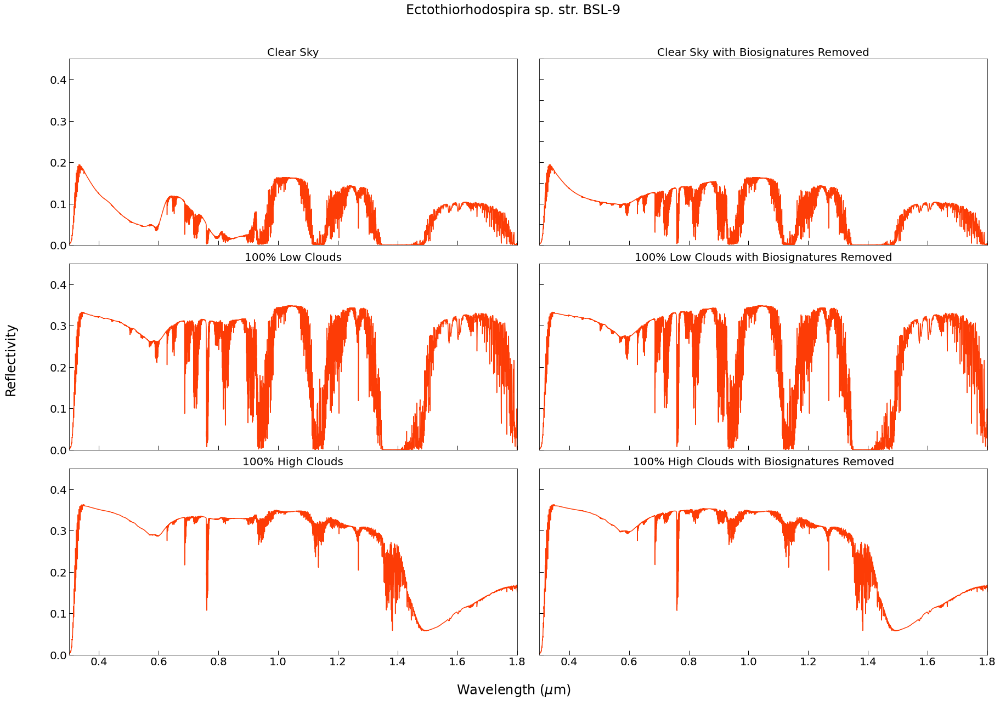

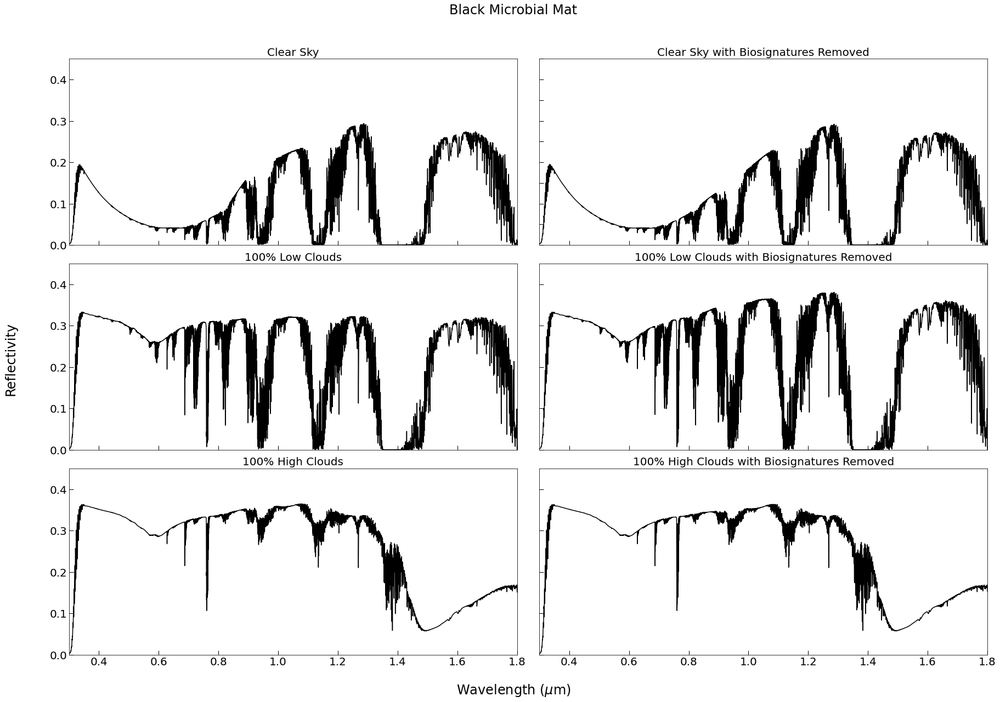

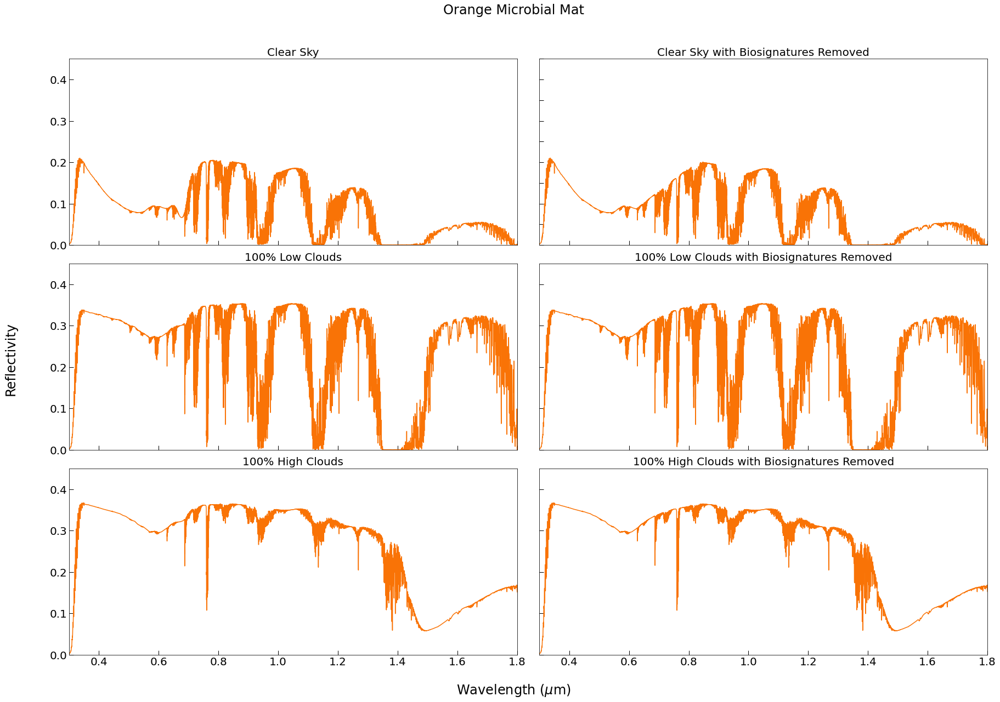

In [5]:
#All microbes' high-resolution SMART spectra without surface spectra comparison


##########################################################################################
#######    Might want to edit the "Biosignatures Removed" label for each cell    #########
##########################################################################################

def highresfigs(title, bioname, abioname, bioname_clear, bioname_low, bioname_high, abioname_clear, abioname_low,\
               abioname_high, color):
    
    fig, axs = plt.subplots(3, 2)
    fig.set_size_inches(30, 20)
    fig.set_facecolor('white')
    plt.subplots_adjust(hspace=0.1, wspace=0.05)
    fig.suptitle(title, fontsize=24, y=0.95)
    fig.supxlabel('Wavelength ($\mu$m)', fontsize = 24, x=0.5, y=0.07)
    fig.supylabel('Reflectivity', fontsize = 24, x=0.07, y=0.5)


    axs[0,0].plot(bioname_clear[0], bioname_clear[1], color)
    axs[0,0].set_title('Clear Sky', fontsize = 20)
    axs[0,0].tick_params(axis='both', direction='in', length=8, width=1, labelsize=20)
    axs[0,0].xaxis.set_ticklabels([])
    axs[0,0].set_xlim(0.3,1.8)
    axs[0,0].set_ylim(0,0.45)

    axs[0,1].plot(abioname_clear[0], abioname_clear[1], color)
    axs[0,1].set_title('Clear Sky with Biosignatures Removed', fontsize = 20)
    axs[0,1].tick_params(axis='both', direction='in',length=8, width=1)
    axs[0,1].yaxis.set_ticklabels([])
    axs[0,1].xaxis.set_ticklabels([])
    axs[0,1].set_xlim(0.3,1.8)
    axs[0,1].set_ylim(0,0.45)


    axs[1,0].plot(bioname_low[0], bioname_low[1], color)
    axs[1,0].set_title('100% Low Clouds', fontsize = 20)
    axs[1,0].tick_params(axis='both', direction='in', length=8, width=1, labelsize=20)
    axs[1,0].xaxis.set_ticklabels([])
    axs[1,0].set_xlim(0.3,1.8)
    axs[1,0].set_ylim(0,0.45)

    axs[1,1].plot(abioname_low[0], abioname_low[1], color)
    axs[1,1].set_title('100% Low Clouds with Biosignatures Removed', fontsize = 20)
    axs[1,1].tick_params(axis='both', direction='in', length=8, width=1, labelsize=20)
    axs[1,1].yaxis.set_ticklabels([])
    axs[1,1].xaxis.set_ticklabels([])
    axs[1,1].set_xlim(0.3,1.8)
    axs[1,1].set_ylim(0,0.45)

    axs[2,0].plot(bioname_high[0], bioname_high[1], color)
    axs[2,0].set_title('100% High Clouds', fontsize = 20)
    axs[2,0].tick_params(axis='both', direction='in', length=8, width=1, labelsize=20)
    axs[2,0].set_xlim(0.3,1.8)
    axs[2,0].set_ylim(0,0.45)

    axs[2,1].plot(abioname_high[0], abioname_high[1], color)
    axs[2,1].set_title('100% High Clouds with Biosignatures Removed', fontsize = 20)
    axs[2,1].tick_params(axis='both', direction='in', length=8, width=1, labelsize=20)
    axs[2,1].yaxis.set_ticklabels([])
    axs[2,1].set_xlim(0.3,1.8)
    axs[2,1].set_ylim(0,0.45)

    #plt.savefig('SMART_' + title + '_highres_nosurface_20220301.png', dpi=400, transparent=True)
    
highresfigs('Arthrobacter sp.', arthro, ascrub, arthro_clear, arthro_low, arthro_high, ascrub_clear, ascrub_low,\
               ascrub_high, 'xkcd:peach')
highresfigs('Ectothiorhodospira sp. str. BSL-9', ecto, escrub, ecto_clear, ecto_low, ecto_high, escrub_clear, \
                escrub_low, escrub_high, 'xkcd:red orange')
highresfigs('Black Microbial Mat', black, bscrub, black_clear, black_low, black_high, bscrub_clear, bscrub_low,\
               bscrub_high, 'xkcd:black')
highresfigs('Orange Microbial Mat', orange, oscrub, orange_clear, orange_low, orange_high, oscrub_clear, oscrub_low,\
               oscrub_high, 'xkcd:orange')

In [6]:
#All microbes' high-resolution SMART spectra with two wavelength ranges represented

def highresfigstwowave(title, bioname, abioname, bioname_clear, bioname_low, bioname_high, abioname_clear, abioname_low,\
               abioname_high, color):
    
    fig = plt.figure(facecolor='white', figsize=(30, 10), dpi=400)
    fig.suptitle(title, fontsize=24, y=1.1)
    fig.supxlabel('Wavelength ($\mu$m)', fontsize = 24, x=0.5, y=-0.1)
    fig.supylabel('Reflectivity', fontsize = 24, x=-0.05, y=0.5)

    gs1 = gridspec.GridSpec(3, 2)
    gs1.update(left=0.0, right=0.45, bottom=0.0 , top=1., wspace=0, hspace=0.2)

    ax0 = fig.add_subplot(gs1[0, 0])
    ax0.plot(bioname_clear[0], bioname_clear[1], color)
    ax0.set_title('Clear Sky', fontsize = 20)
    ax0.tick_params(axis='both', direction='in', length=8, width=1, labelsize=20)
    ax0.xaxis.set_ticklabels([])
    ax0.set_xlim(0.3,1)
    ax0.set_ylim(0,0.45)
    ax0.plot()

    ax1 = fig.add_subplot(gs1[0,1])
    ax1.plot(bioname_clear[0], bioname_clear[1], color)
    ax1.set_title('Clear Sky', fontsize = 20)
    ax1.tick_params(axis='both', direction='in', length=8, width=1, labelsize=20)
    ax1.yaxis.set_ticklabels([])
    ax1.xaxis.set_ticklabels([])
    ax1.set_xlim(0.3,2.5)
    ax1.set_ylim(0,0.45)
    ax1.plot()

    ax2 = fig.add_subplot(gs1[1,0])
    ax2.plot(bioname_low[0], bioname_low[1], color)
    ax2.set_title('100% Low Clouds', fontsize = 20)
    ax2.tick_params(axis='both', direction='in', length=8, width=1, labelsize=20)
    ax2.xaxis.set_ticklabels([])
    ax2.set_xlim(0.3,1)
    ax2.set_ylim(0,0.45)
    ax2.plot()

    ax3 = fig.add_subplot(gs1[1,1])
    ax3.plot(bioname_low[0], bioname_low[1], color)
    ax3.set_title('100% Low Clouds', fontsize = 20)
    ax3.tick_params(axis='both', direction='in', length=8, width=1, labelsize=20)
    ax3.yaxis.set_ticklabels([])
    ax3.xaxis.set_ticklabels([])
    ax3.set_xlim(0.3,2.5)
    ax3.set_ylim(0,0.45)
    ax3.plot()

    ax4 = fig.add_subplot(gs1[2,0])
    ax4.plot(bioname_high[0], bioname_high[1], color)
    ax4.set_title('100% High Clouds', fontsize = 20)
    ax4.tick_params(axis='both', direction='in', length=8, width=1, labelsize=20)
    ax4.set_xlim(0.3,1)
    ax4.set_ylim(0,0.45)
    ax4.plot()

    ax5 = fig.add_subplot(gs1[2,1])
    ax5.plot(bioname_high[0], bioname_high[1], color)
    ax5.set_title('100% High Clouds', fontsize = 20)
    ax5.tick_params(axis='both', direction='in', length=8, width=1, labelsize=20)
    ax5.yaxis.set_ticklabels([])
    ax5.set_xlim(0.3,2.5)
    ax5.set_ylim(0,0.45)
    ax5.plot()


    gs2 = gridspec.GridSpec(3, 2)
    gs2.update(left=0.55, right=1.0, bottom=0.0 , top=1., wspace=0, hspace=0.2)

    ax6 = fig.add_subplot(gs2[0, 0])
    ax6.plot(abioname_clear[0], abioname_clear[1], color)
    ax6.set_title('Clear Sky with Biosignatures Removed', fontsize = 20)
    ax6.tick_params(axis='both', direction='in', length=8, width=1, labelsize=20)
    ax6.xaxis.set_ticklabels([])
    ax6.set_xlim(0.3,1)
    ax6.set_ylim(0,0.45)
    ax6.plot()

    ax7 = fig.add_subplot(gs2[0,1])
    ax7.plot(abioname_clear[0], abioname_clear[1], color)
    ax7.set_title('Clear Sky with Biosignatures Removed', fontsize = 20)
    ax7.tick_params(axis='both', direction='in', length=8, width=1,labelsize=20)
    ax7.yaxis.set_ticklabels([])
    ax7.xaxis.set_ticklabels([])
    ax7.set_xlim(0.3,2.5)
    ax7.set_ylim(0,0.45)
    ax7.plot()

    ax8 = fig.add_subplot(gs2[1,0])
    ax8.plot(abioname_low[0], abioname_low[1], color)
    ax8.set_title('100% Low Clouds with Biosignatures Removed', fontsize = 20)
    ax8.tick_params(axis='both', direction='in', length=8, width=1,labelsize=20)
    ax8.xaxis.set_ticklabels([])
    ax8.set_xlim(0.3,1)
    ax8.set_ylim(0,0.45)
    ax8.plot()

    ax9 = fig.add_subplot(gs2[1,1])
    ax9.plot(abioname_low[0], abioname_low[1], color)
    ax9.set_title('100% Low Clouds with Biosignatures Removed', fontsize = 20)
    ax9.tick_params(axis='both', direction='in', length=8, width=1,labelsize=20)
    ax9.yaxis.set_ticklabels([])
    ax9.xaxis.set_ticklabels([])
    ax9.set_xlim(0.3,2.5)
    ax9.set_ylim(0,0.45)
    ax9.plot()

    ax10 = fig.add_subplot(gs2[2,0])
    ax10.plot(abioname_high[0], abioname_high[1], color)
    ax10.set_title('100% High Clouds with Biosignatures Removed', fontsize = 20)
    ax10.tick_params(axis='both', direction='in', length=8, width=1,labelsize=20)
    ax10.set_xlim(0.3,1)
    ax10.set_ylim(0,0.45)
    ax10.plot()

    ax11 = fig.add_subplot(gs2[2,1])
    ax11.plot(abioname_high[0], abioname_high[1], color)
    ax11.set_title('100% High Clouds with Biosignatures Removed', fontsize = 20)
    ax11.tick_params(axis='both', direction='in', length=8, width=1,labelsize=20)
    ax11.yaxis.set_ticklabels([])
    ax11.set_xlim(0.3,2.5)
    ax11.set_ylim(0,0.45)
    ax11.plot()

    #plt.savefig('SMART_' + title + '_highres_twowave_20220301.png', transparent=True)
    
    
highresfigstwowave('Arthrobacter sp.', arthro, ascrub, arthro_clear, arthro_low, arthro_high, ascrub_clear, ascrub_low,\
               ascrub_high, 'xkcd:peach')
highresfigstwowave('Ectothiorhodospira sp. str. BSL-9', ecto, escrub, ecto_clear, ecto_low, ecto_high, escrub_clear, \
                escrub_low, escrub_high, 'xkcd:red orange')
highresfigstwowave('Black Microbial Mat', black, bscrub, black_clear, black_low, black_high, bscrub_clear, bscrub_low,\
               bscrub_high, 'xkcd:black')
highresfigstwowave('Orange Microbial Mat', orange, oscrub, orange_clear, orange_low, orange_high, oscrub_clear, oscrub_low,\
               oscrub_high, 'xkcd:orange')

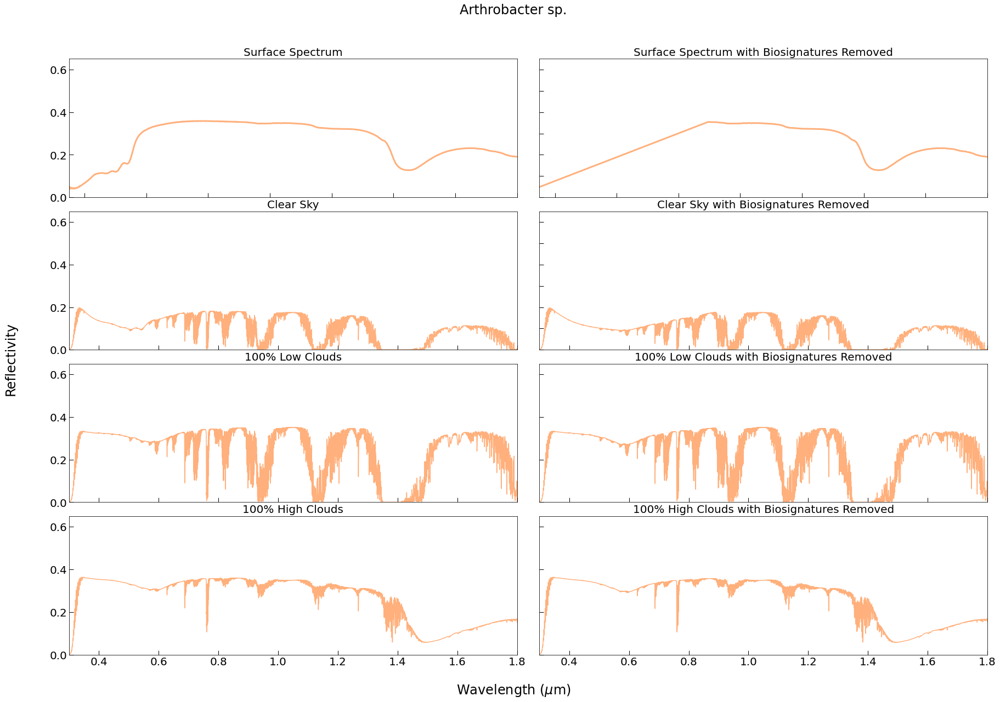

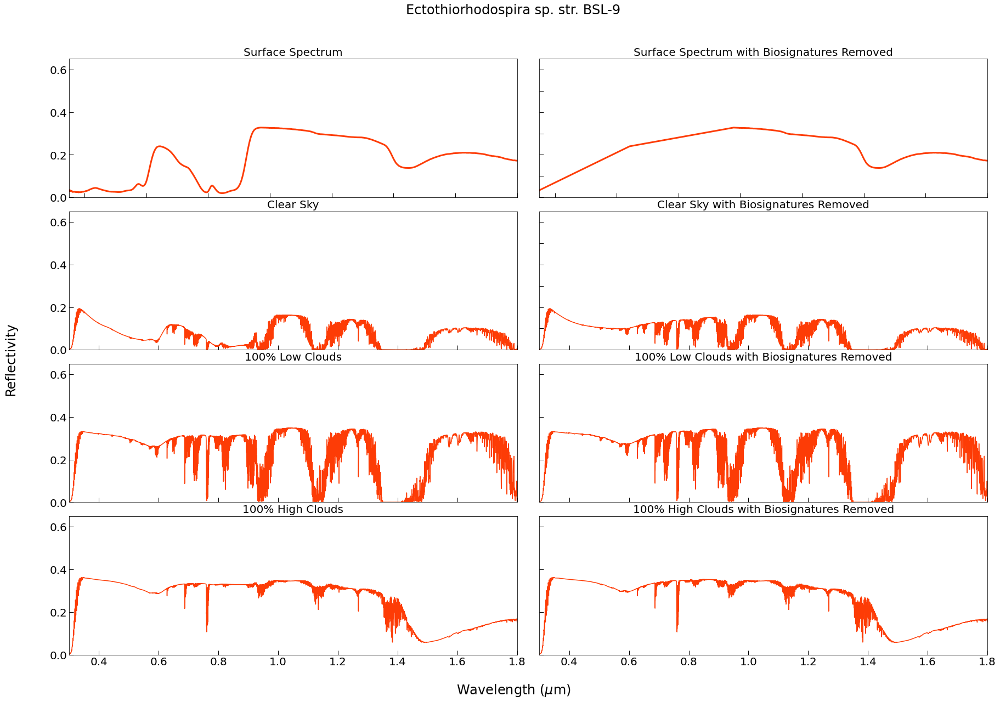

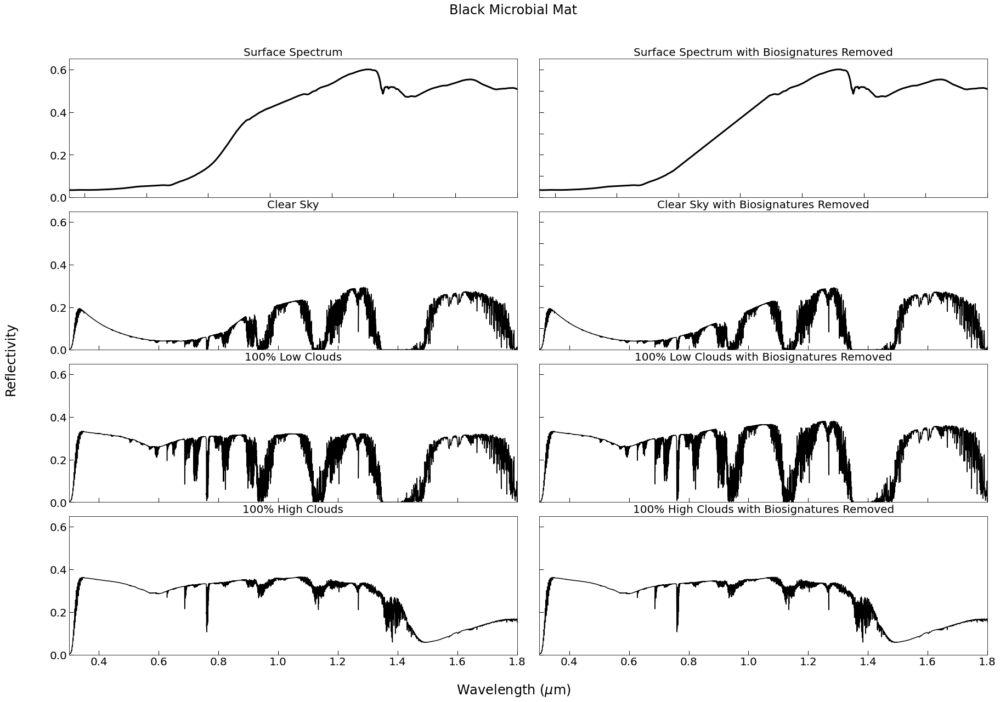

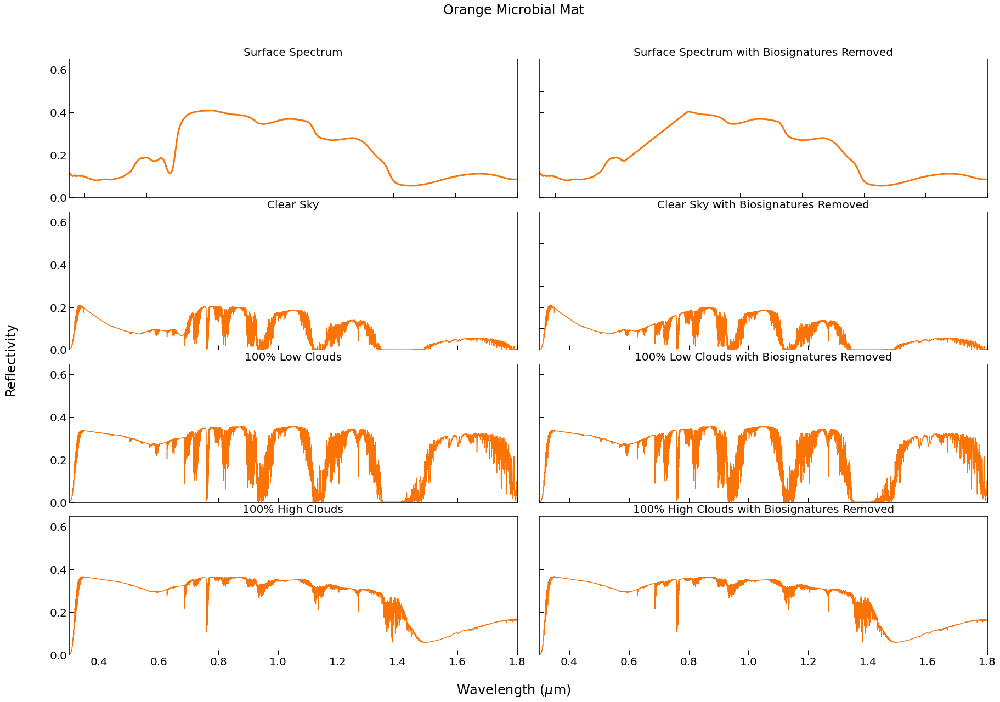

In [7]:
#All microbes' high-resolution SMART spectra compared with surface spectra

def highresfigswsurface(title, bioname, abioname, bioname_clear, bioname_low, bioname_high, abioname_clear, abioname_low,\
               abioname_high, color):
    
    fig, axs = plt.subplots(4, 2)
    fig.set_size_inches(30, 20)
    fig.set_facecolor('white')
    plt.subplots_adjust(hspace=0.1, wspace=0.05)
    fig.suptitle(title, fontsize=24, y=0.95)
    fig.supxlabel('Wavelength ($\mu$m)', fontsize = 24, x=0.5, y=0.07)
    fig.supylabel('Reflectivity', fontsize = 24, x=0.07, y=0.5)

    axs[0,0].plot(wavelength, bioname.columns[1], color,linewidth=3)
    axs[0,0].set_title('Surface Spectrum', fontsize = 20)
    axs[0,0].tick_params(axis='both', direction='in', length=8, width=1, labelsize=20)
    axs[0,0].xaxis.set_ticklabels([])
    axs[0,0].set_xlim(0.35,1.8)
    axs[0,0].set_ylim(0,0.65)

    axs[0,1].plot(wavelength, abioname.columns[1], color,linewidth=3)
    axs[0,1].set_title('Surface Spectrum with Biosignatures Removed', fontsize = 20)
    axs[0,1].tick_params(axis='both', direction='in',length=8, width=1)
    axs[0,1].yaxis.set_ticklabels([])
    axs[0,1].xaxis.set_ticklabels([])
    axs[0,1].set_xlim(0.35,1.8)
    axs[0,1].set_ylim(0,0.65)


    axs[1,0].plot(bioname_clear[0], bioname_clear[1], color)
    axs[1,0].set_title('Clear Sky', fontsize = 20)
    axs[1,0].tick_params(axis='both', direction='in', length=8, width=1, labelsize=20)
    axs[1,0].xaxis.set_ticklabels([])
    axs[1,0].set_xlim(0.3,1.8)
    axs[1,0].set_ylim(0,0.65)

    axs[1,1].plot(abioname_clear[0], abioname_clear[1], color)
    axs[1,1].set_title('Clear Sky with Biosignatures Removed', fontsize = 20)
    axs[1,1].tick_params(axis='both', direction='in',length=8, width=1)
    axs[1,1].yaxis.set_ticklabels([])
    axs[1,1].xaxis.set_ticklabels([])
    axs[1,1].set_xlim(0.3,1.8)
    axs[1,1].set_ylim(0,0.65)


    axs[2,0].plot(bioname_low[0], bioname_low[1], color)
    axs[2,0].set_title('100% Low Clouds', fontsize = 20)
    axs[2,0].tick_params(axis='both', direction='in', length=8, width=1, labelsize=20)
    axs[2,0].xaxis.set_ticklabels([])
    axs[2,0].set_xlim(0.3,1.8)
    axs[2,0].set_ylim(0,0.65)

    axs[2,1].plot(abioname_low[0], abioname_low[1], color)
    axs[2,1].set_title('100% Low Clouds with Biosignatures Removed', fontsize = 20)
    axs[2,1].tick_params(axis='both', direction='in', length=8, width=1, labelsize=20)
    axs[2,1].yaxis.set_ticklabels([])
    axs[2,1].xaxis.set_ticklabels([])
    axs[2,1].set_xlim(0.3,1.8)
    axs[2,1].set_ylim(0,0.65)

    axs[3,0].plot(bioname_high[0], bioname_high[1], color)
    axs[3,0].set_title('100% High Clouds', fontsize = 20)
    axs[3,0].tick_params(axis='both', direction='in', length=8, width=1, labelsize=20)
    axs[3,0].set_xlim(0.3,1.8)
    axs[3,0].set_ylim(0,0.65)

    axs[3,1].plot(abioname_high[0], abioname_high[1], color)
    axs[3,1].set_title('100% High Clouds with Biosignatures Removed', fontsize = 20)
    axs[3,1].tick_params(axis='both', direction='in', length=8, width=1, labelsize=20)
    axs[3,1].yaxis.set_ticklabels([])
    axs[3,1].set_xlim(0.3,1.8)
    axs[3,1].set_ylim(0,0.65)

    #plt.savefig('SMART_' + title + '_highres_wsurface_20220301.png', dpi=400, transparent=True)

highresfigswsurface('Arthrobacter sp.', arthro, ascrub, arthro_clear, arthro_low, arthro_high, ascrub_clear, ascrub_low,\
               ascrub_high,'xkcd:peach')
highresfigswsurface('Ectothiorhodospira sp. str. BSL-9', ecto, escrub, ecto_clear, ecto_low, ecto_high, escrub_clear, \
               escrub_low, escrub_high,'xkcd:red orange')
highresfigswsurface('Black Microbial Mat', black, bscrub, black_clear, black_low, black_high, bscrub_clear, bscrub_low,\
               bscrub_high, 'xkcd:black')
highresfigswsurface('Orange Microbial Mat', orange, oscrub, orange_clear, orange_low, orange_high, oscrub_clear, oscrub_low,\
               oscrub_high,'xkcd:orange')

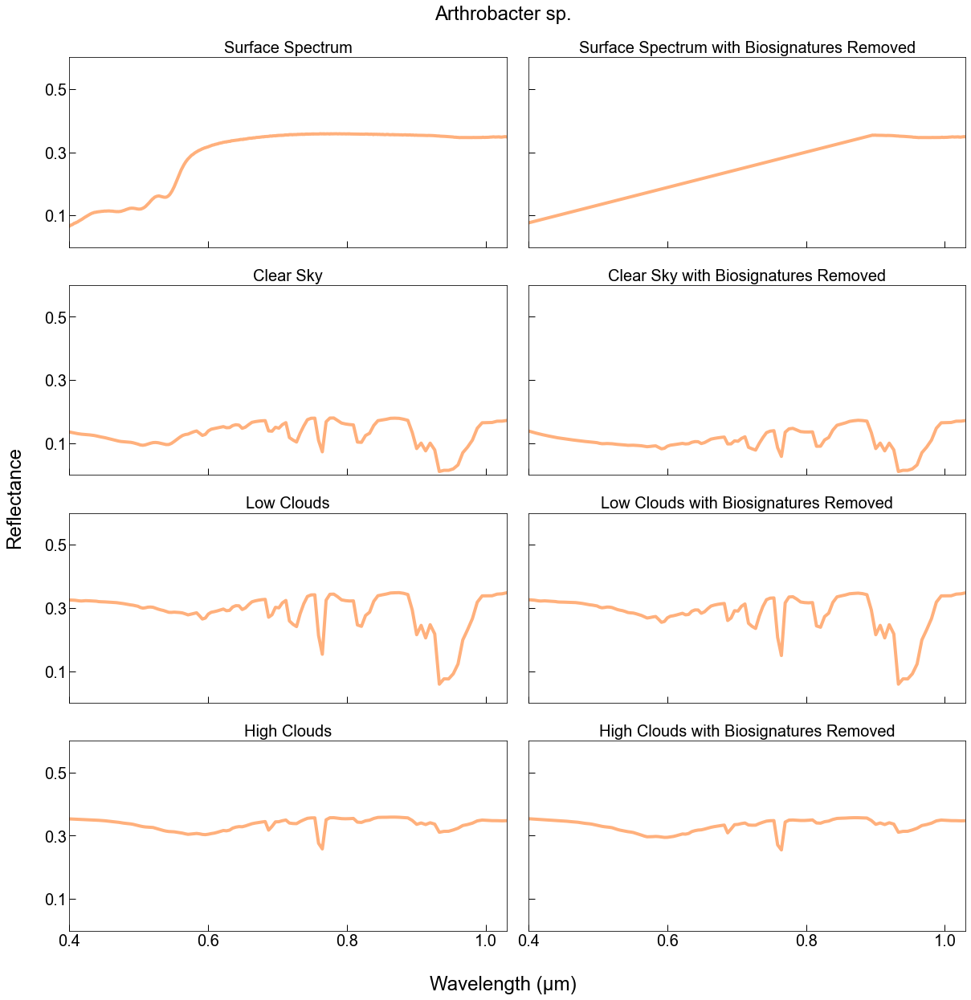

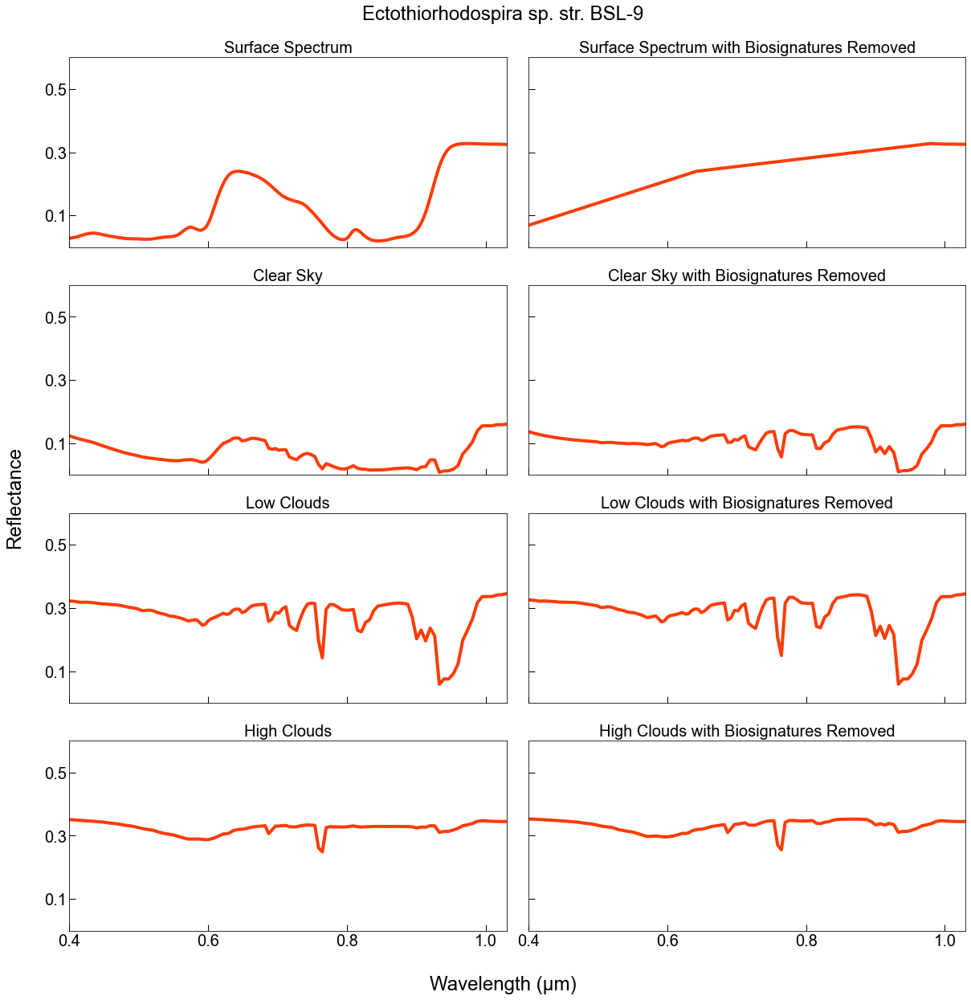

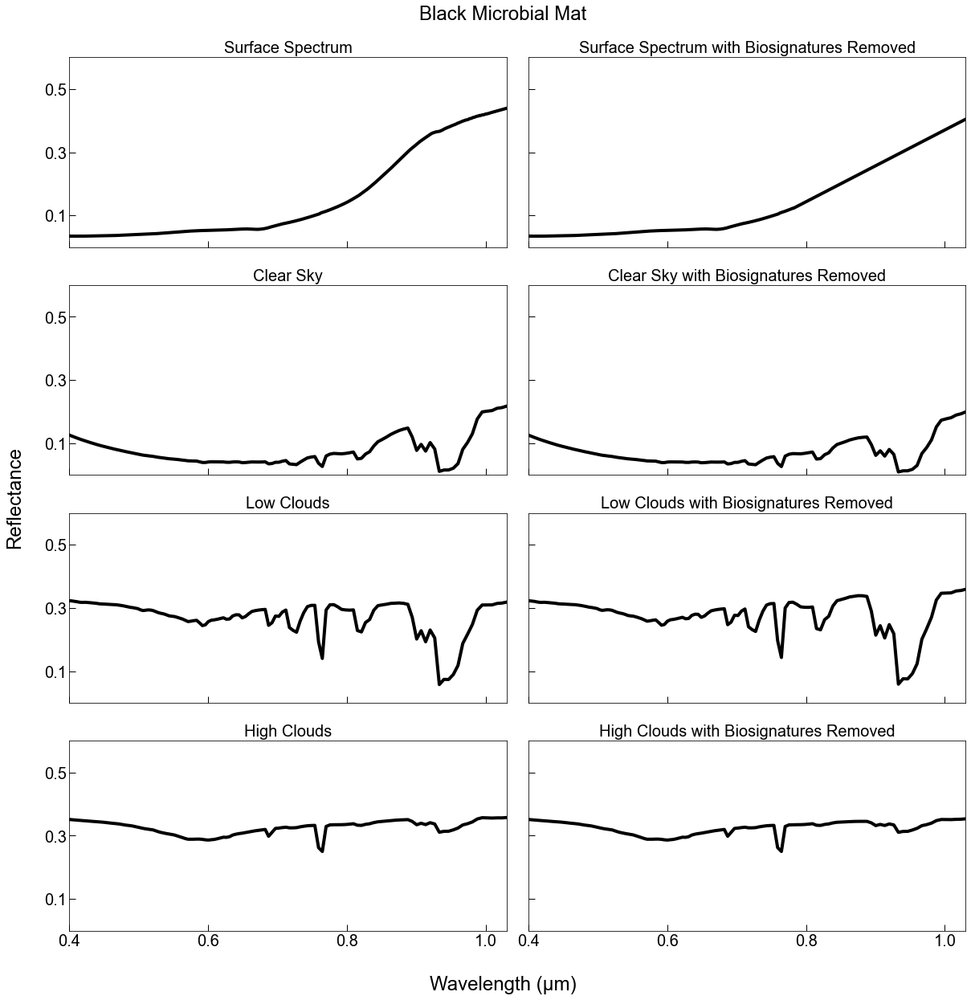

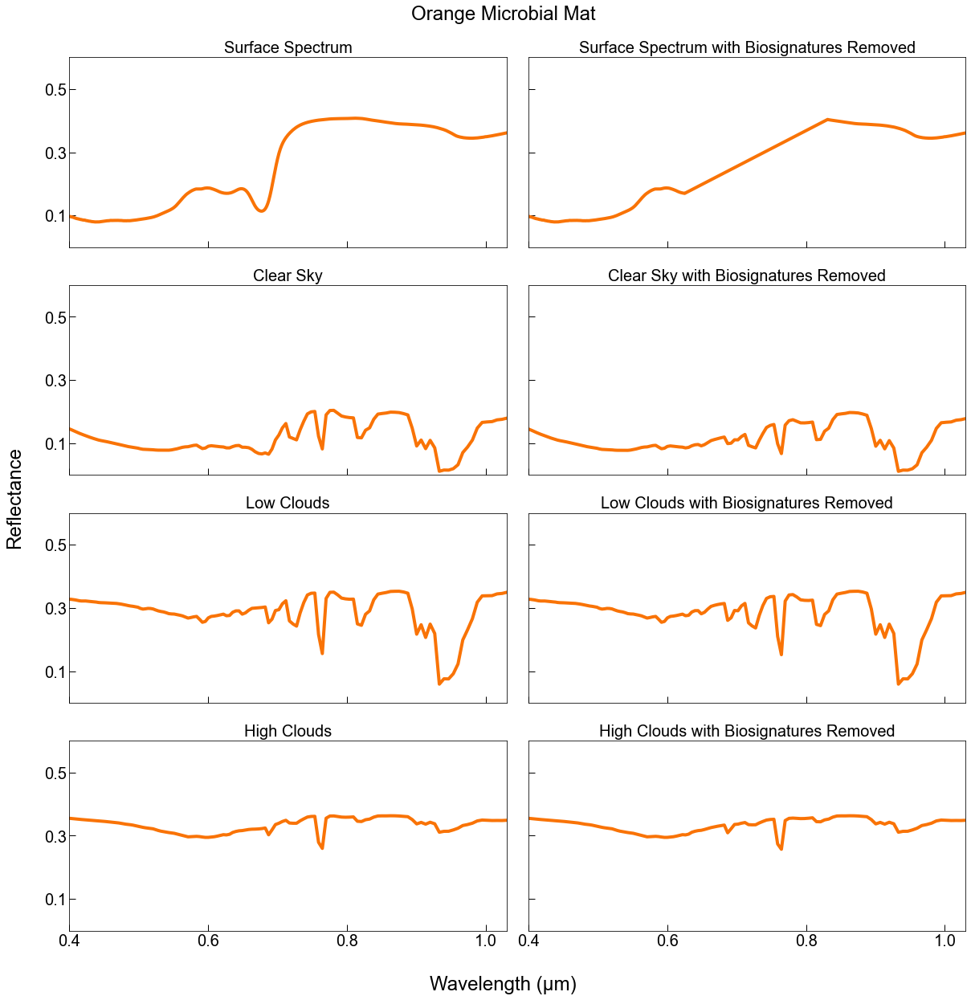

In [5]:
#All microbes' low resolution cloud SMART spectra compared with surface spectra

def downspec(flux, lam):
    # Set the wavelength and resolution parameters
    lammin = 0.4
    lammax = 1.030
    R = 140
    #dl = 0.01

    # Construct new low-res wavelength grid
    wl, dwl = cg.noise_routines.construct_lam(lammin, lammax, R)

    # Down-bin flux to low-res
    flr = cg.downbin_spec(flux, lam, wl, dlam=dwl)
    
    return np.array([wl,flr])

def lowresfigswsurface(title, bioname, abioname, bioname_clear, bioname_low, bioname_high, abioname_clear, abioname_low,\
               abioname_high, color):
    font = {'fontname':'Arial'}
    
    fig, axs = plt.subplots(4, 2)
    fig.set_size_inches(20, 20)
    fig.set_facecolor('white')
    plt.subplots_adjust(hspace=0.2, wspace=0.05)
    fig.suptitle(title, fontsize=24, y=0.925, **font)
    fig.supxlabel('Wavelength (' + u'\u03bc' + 'm)', fontsize = 24, x=0.5, y=0.07, **font)
    fig.supylabel('Reflectance', fontsize = 24, x=0.07, y=0.5, **font)
    xlim=(0.4,1.030)
    ylim=(0,0.6)
    plt.setp(axs, xlim=xlim, ylim=ylim)


    axs[0,0].plot(wavelength, bioname.columns[1], color,linewidth=4)
    axs[0,0].set_title('Surface Spectrum', fontsize = 20, **font)
    axs[0,0].tick_params(axis='both', direction='in', length=8, width=1, labelsize=20)
    axs[0,0].set_yticks(np.arange(0.1, 0.7, step=0.2))
    axs[0,0].set_xticks(np.arange(0.4, 1.03, step=0.2))
    for tick in axs[0,0].get_xticklabels():
        tick.set_fontname("Arial")
    for tick in axs[0,0].get_yticklabels():
        tick.set_fontname("Arial")
    axs[0,0].xaxis.set_ticklabels([])


    axs[0,1].plot(wavelength, abioname.columns[1], color,linewidth=4)
    axs[0,1].set_title('Surface Spectrum with Biosignatures Removed', fontsize = 20, **font)
    axs[0,1].tick_params(axis='both', direction='in', length=8, width=1, labelsize=20)
    axs[0,1].set_yticks(np.arange(0.1, 0.7, step=0.2))
    axs[0,1].set_xticks(np.arange(0.4, 1.03, step=0.2))
    for tick in axs[0,1].get_xticklabels():
        tick.set_fontname("Arial")
    for tick in axs[0,1].get_yticklabels():
        tick.set_fontname("Arial")
    axs[0,1].yaxis.set_ticklabels([])
    axs[0,1].xaxis.set_ticklabels([])


    axs[1,0].plot(downspec(bioname_clear[1], bioname_clear[0])[0],downspec(bioname_clear[1], bioname_clear[0])[1],\
                  color,linewidth=4)
    axs[1,0].set_title('Clear Sky', fontsize = 20, **font)
    axs[1,0].tick_params(axis='both', direction='in', length=8, width=1, labelsize=20)
    axs[1,0].set_yticks(np.arange(0.1, 0.7, step=0.2))
    axs[1,0].set_xticks(np.arange(0.4, 1.03, step=0.2))
    for tick in axs[1,0].get_xticklabels():
        tick.set_fontname("Arial")
    for tick in axs[1,0].get_yticklabels():
        tick.set_fontname("Arial")
    #axs[1,0].set_xscale('log')
    axs[1,0].xaxis.set_ticklabels([])


    axs[1,1].plot(downspec(abioname_clear[1], abioname_clear[0])[0],downspec(abioname_clear[1], abioname_clear[0])[1],\
                  color,linewidth=4)
    axs[1,1].set_title('Clear Sky with Biosignatures Removed', fontsize = 20, **font)
    axs[1,1].tick_params(axis='both', direction='in',length=8, width=1)
    axs[1,1].set_yticks(np.arange(0.1, 0.7, step=0.2))
    axs[1,1].set_xticks(np.arange(0.4, 1.03, step=0.2))
    for tick in axs[1,1].get_xticklabels():
        tick.set_fontname("Arial")
    for tick in axs[1,1].get_yticklabels():
        tick.set_fontname("Arial")
    #axs[1,1].set_xscale('log')
    axs[1,1].yaxis.set_ticklabels([])
    axs[1,1].xaxis.set_ticklabels([])

    
    axs[2,0].plot(downspec(bioname_low[1], bioname_low[0])[0],downspec(bioname_low[1], bioname_low[0])[1], \
                  color,linewidth=4)
    axs[2,0].set_title('Low Clouds', fontsize = 20, **font)
    axs[2,0].tick_params(axis='both', direction='in', length=8, width=1, labelsize=20)
    axs[2,0].set_yticks(np.arange(0.1, 0.7, step=0.2))
    axs[2,0].set_xticks(np.arange(0.4, 1.03, step=0.2))
    for tick in axs[2,0].get_xticklabels():
        tick.set_fontname("Arial")
    for tick in axs[2,0].get_yticklabels():
        tick.set_fontname("Arial")
    #axs[2,0].set_xscale('log')
    axs[2,0].xaxis.set_ticklabels([])

    
    axs[2,1].plot(downspec(abioname_low[1], abioname_low[0])[0],downspec(abioname_low[1], abioname_low[0])[1], \
                  color,linewidth=4)
    axs[2,1].set_title('Low Clouds with Biosignatures Removed', fontsize = 20, **font)
    axs[2,1].tick_params(axis='both', direction='in', length=8, width=1, labelsize=20)
    axs[2,1].set_yticks(np.arange(0.1, 0.7, step=0.2))
    axs[2,1].set_xticks(np.arange(0.4, 1.03, step=0.2))
    for tick in axs[2,1].get_xticklabels():
        tick.set_fontname("Arial")
    for tick in axs[2,1].get_yticklabels():
        tick.set_fontname("Arial")
    #axs[2,1].set_xscale('log')
    axs[2,1].yaxis.set_ticklabels([])
    axs[2,1].xaxis.set_ticklabels([])

    
    axs[3,0].plot(downspec(bioname_high[1], bioname_high[0])[0],downspec(bioname_high[1], bioname_high[0])[1],\
                  color,linewidth=4)
    axs[3,0].set_title('High Clouds', fontsize = 20, **font)
    axs[3,0].tick_params(axis='both', direction='in', length=8, width=1, labelsize=20)
    axs[3,0].set_yticks(np.arange(0.1, 0.7, step=0.2))
    axs[3,0].set_xticks(np.arange(0.4, 1.03, step=0.2))
    for tick in axs[3,0].get_xticklabels():
        tick.set_fontname("Arial")
    for tick in axs[3,0].get_yticklabels():
        tick.set_fontname("Arial")
    #axs[3,0].set_xscale('log')

    
    axs[3,1].plot(downspec(abioname_high[1], abioname_high[0])[0],downspec(abioname_high[1], abioname_high[0])[1], \
                  color,linewidth=4)
    axs[3,1].set_title('High Clouds with Biosignatures Removed', fontsize = 20, **font)
    axs[3,1].tick_params(axis='both', direction='in', length=8, width=1, labelsize=20)
    axs[3,1].yaxis.set_ticklabels([])
    axs[3,1].set_yticks(np.arange(0.1, 0.7, step=0.2))
    axs[3,1].set_xticks(np.arange(0.4, 1.03, step=0.2))
    for tick in axs[3,1].get_xticklabels():
        tick.set_fontname("Arial")
    for tick in axs[3,1].get_yticklabels():
        tick.set_fontname("Arial")
    #axs[3,1].set_xscale('log')

    
    #plt.savefig('SMART_' + title + '_lowres_wsurface_20220413.png')
    
    
lowresfigswsurface('Arthrobacter sp.', arthro, ascrub, arthro_clear, arthro_low, arthro_high, ascrub_clear, ascrub_low,\
               ascrub_high,'xkcd:peach')
lowresfigswsurface('Ectothiorhodospira sp. str. BSL-9', ecto, escrub, ecto_clear, ecto_low, ecto_high, escrub_clear, \
               escrub_low, escrub_high,'xkcd:red orange')
lowresfigswsurface('Black Microbial Mat', black, bscrub, black_clear, black_low, black_high, bscrub_clear, bscrub_low,\
               bscrub_high, 'xkcd:black')
lowresfigswsurface('Orange Microbial Mat', orange, oscrub, orange_clear, orange_low, orange_high, oscrub_clear, oscrub_low,\
               oscrub_high,'xkcd:orange')

# both = (downspec(arthro_clear[1],ascrub_clear[0]))
# print(len(both[0]))

(0.0, 0.5)

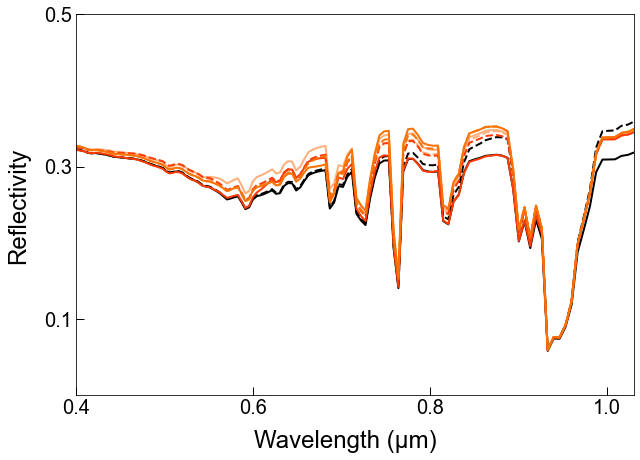

In [49]:

font = {'fontname':'Arial'}
    
fig, ax = plt.subplots()
fig.set_size_inches(10, 7)
fig.set_facecolor('white')
fig.supxlabel('Wavelength (' + u'\u03bc' + 'm)', fontsize = 24, x=0.5, y=0.01, **font)
fig.supylabel('Reflectance', fontsize = 24, x=0.03, y=0.5, **font)


ax.plot(downspec(arthro_low[1], arthro_low[0])[0], downspec(arthro_low[1], arthro_low[0])[1],\
        'xkcd:peach', linewidth=2)
ax.plot(downspec(ascrub_low[1], ascrub_low[0])[0], downspec(ascrub_low[1], ascrub_low[0])[1],\
        'xkcd:peach', linewidth=2, ls = 'dashed')
ax.plot(downspec(black_low[1], black_low[0])[0], downspec(black_low[1], black_low[0])[1],\
        'xkcd:black', linewidth=2)
ax.plot(downspec(bscrub_low[1], bscrub_low[0])[0], downspec(bscrub_low[1], bscrub_low[0])[1],\
        'xkcd:black', linewidth=2, ls = 'dashed')
ax.plot(downspec(ecto_low[1], ecto_low[0])[0], downspec(ecto_low[1], ecto_low[0])[1],\
        'xkcd:red orange', linewidth=2)
ax.plot(downspec(escrub_low[1], escrub_low[0])[0], downspec(escrub_low[1], escrub_low[0])[1],\
        'xkcd:red orange', linewidth=2, ls = 'dashed')
ax.plot(downspec(orange_low[1], orange_low[0])[0], downspec(orange_low[1], orange_low[0])[1],\
        'xkcd:orange', linewidth=2)
ax.plot(downspec(oscrub_low[1], oscrub_low[0])[0], downspec(oscrub_low[1], oscrub_low[0])[1],\
        'xkcd:orange', linewidth=2, ls = 'dashed')

ax.set_xlim(0.4,1.030)
plt.xticks(np.arange(0.4, 1.03, step=0.2))  # Set x tick locations.
plt.yticks(np.arange(0.1, 0.6, step=0.2))  # Set y tick locations.
ax.tick_params(direction='in',length=8, width=1, labelsize=20)
for tick in ax.get_xticklabels():
    tick.set_fontname("Arial")
for tick in ax.get_yticklabels():
    tick.set_fontname("Arial")
#legparams = font_manager.FontProperties(family = 'Arial', size = 13)
ax.set_ylim(bottom = 0.0, top = 0.5)
#ax.legend(fontsize = 13, ncol=1, prop = legparams)

[Text(0, 0.1, ''), Text(0, 0.30000000000000004, '')]

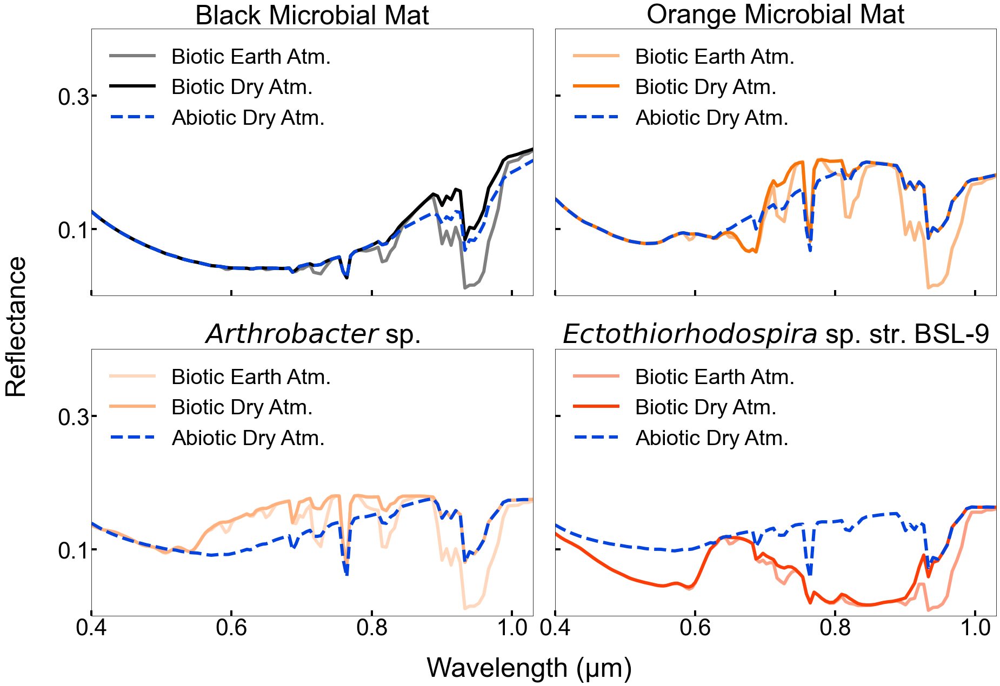

In [7]:
########################################################################################
## Plotting SMART spectra of microbes at clear skies with a low water vapor atmosphere##
########################################################################################


#Biological and abiologic clear sky low water vapor spectra 

font = {'fontname':'Arial'}

fig, axs = plt.subplots(2, 2)
fig.set_size_inches(30, 20)
fig.set_facecolor('white')
plt.subplots_adjust(hspace=0.2, wspace=0.05)
fig.supxlabel('Wavelength (' + u'\u03bc' + 'm)', fontsize = 50, x=0.5, y=0.04, **font)
fig.supylabel('Reflectance', fontsize = 50, x=0.05, y=0.5, **font)
xlim=(0.4,1.030)
ylim=(0,0.4)
plt.setp(axs, xlim=xlim, ylim=ylim)
legparams = font_manager.FontProperties(family = 'Arial', size = 40)


# Black mat
axs[0,0].plot(downspec(black_clear[1], black_clear[0])[0], downspec(black_clear[1], black_clear[0])[1],\
              'xkcd:black',linewidth=6, ls = 'solid', alpha = 0.5, label = 'Biotic Earth Atm.')
axs[0,0].plot(downspec(black_lowh2o[1], black_lowh2o[0])[0], downspec(black_lowh2o[1], black_lowh2o[0])[1],\
              'xkcd:black', linewidth=6, label = 'Biotic Dry Atm.')
axs[0,0].plot(downspec(bscrub_lowh2o[1], bscrub_lowh2o[0])[0], downspec(bscrub_lowh2o[1], bscrub_lowh2o[0])[1],\
              'xkcd:blue',linewidth=6, ls = 'dashed', label = 'Abiotic Dry Atm.')
axs[0,0].set_title('Black Microbial Mat', fontsize = 50, **font)
axs[0,0].tick_params(axis='both', direction='in', length=10, width=4, labelsize=43)
axs[0,0].set_yticks(np.arange(0.1, 0.4, step=0.2))
axs[0,0].set_xticks(np.arange(0.4, 1.03, step=0.2))
axs[0,0].legend(fontsize = 40, ncol=1, prop = legparams, frameon=False, loc = 'upper left')
for tick in axs[0,0].get_xticklabels():
    tick.set_fontname("Arial")
for tick in axs[0,0].get_yticklabels():
    tick.set_fontname("Arial")
axs[0,0].xaxis.set_ticklabels([])

# Orange mat
axs[0,1].plot(downspec(orange_clear[1], orange_clear[0])[0], downspec(orange_clear[1], orange_clear[0])[1],\
              'xkcd:orange',linewidth=6, ls = 'solid', alpha = 0.5, label = 'Biotic Earth Atm.')
axs[0,1].plot(downspec(orange_lowh2o[1], orange_lowh2o[0])[0], downspec(orange_lowh2o[1], orange_lowh2o[0])[1],\
              'xkcd:orange', linewidth=6, label = 'Biotic Dry Atm.')
axs[0,1].plot(downspec(oscrub_lowh2o[1], oscrub_lowh2o[0])[0], downspec(oscrub_lowh2o[1], oscrub_lowh2o[0])[1],\
              'xkcd:blue',linewidth=6, ls = 'dashed', label = 'Abiotic Dry Atm.')
axs[0,1].set_title('Orange Microbial Mat', fontsize = 50, **font)
axs[0,1].tick_params(axis='both', direction='in',length=10, width=4, labelsize=43)
axs[0,1].set_yticks(np.arange(0.1, 0.4, step=0.2))
axs[0,1].set_xticks(np.arange(0.4, 1.03, step=0.2))
axs[0,1].legend(fontsize = 40, ncol=1, prop = legparams, frameon=False, loc = 'upper left')
for tick in axs[0,1].get_xticklabels():
    tick.set_fontname("Arial")
for tick in axs[0,1].get_yticklabels():
    tick.set_fontname("Arial")
axs[0,1].yaxis.set_ticklabels([])
axs[0,1].xaxis.set_ticklabels([])

# Arthrobacter
axs[1,0].plot(downspec(arthro_clear[1], arthro_clear[0])[0], downspec(arthro_clear[1], arthro_clear[0])[1],\
              'xkcd:peach',linewidth=6, ls= 'solid', alpha = 0.5, label = 'Biotic Earth Atm.')
axs[1,0].plot(downspec(arthro_lowh2o[1], arthro_lowh2o[0])[0], downspec(arthro_lowh2o[1], arthro_lowh2o[0])[1],\
              'xkcd:peach',linewidth=6, label = 'Biotic Dry Atm.')
axs[1,0].plot(downspec(ascrub_lowh2o[1], ascrub_lowh2o[0])[0], downspec(ascrub_lowh2o[1], ascrub_lowh2o[0])[1],\
              'xkcd:blue',linewidth=6, ls= 'dashed', label = 'Abiotic Dry Atm.')
axs[1,0].set_title('$\it{Arthrobacter}$ sp.', fontsize = 50, **font)
axs[1,0].tick_params(axis='both', direction='in', length=10, width=4, labelsize=43)
axs[1,0].set_yticks(np.arange(0.1, 0.4, step=0.2))
axs[1,0].set_xticks(np.arange(0.4, 1.03, step=0.2))
axs[1,0].legend(fontsize = 40, ncol=1, prop = legparams, frameon=False, loc = 'upper left')
for tick in axs[1,0].get_xticklabels():
    tick.set_fontname("Arial")
for tick in axs[1,0].get_yticklabels():
    tick.set_fontname("Arial")

# Ectothiorhodospira
axs[1,1].plot(downspec(ecto_clear[1], ecto_clear[0])[0], downspec(ecto_clear[1], ecto_clear[0])[1],\
              'xkcd:red orange',linewidth=6, ls = 'solid', alpha = 0.5, label = 'Biotic Earth Atm.')
axs[1,1].plot(downspec(ecto_lowh2o[1], ecto_lowh2o[0])[0], downspec(ecto_lowh2o[1], ecto_lowh2o[0])[1],\
              'xkcd:red orange',linewidth=6, label = 'Biotic Dry Atm.')
axs[1,1].plot(downspec(escrub_lowh2o[1], escrub_lowh2o[0])[0], downspec(escrub_lowh2o[1], escrub_lowh2o[0])[1],\
              'xkcd:blue',linewidth=6, ls = 'dashed', label = 'Abiotic Dry Atm.')
axs[1,1].set_title('$\it{Ectothiorhodospira}$ sp. str. BSL-9', fontsize = 50, **font)
axs[1,1].tick_params(axis='both', direction='in',length=10, width=4, labelsize=43)
axs[1,1].set_yticks(np.arange(0.1, 0.4, step=0.2))
axs[1,1].set_xticks(np.arange(0.4, 1.03, step=0.2))
axs[1,1].legend(fontsize = 40, ncol=1, prop = legparams, frameon=False, loc = 'upper left')
for tick in axs[1,1].get_xticklabels():
    tick.set_fontname("Arial")
for tick in axs[1,1].get_yticklabels():
    tick.set_fontname("Arial")
axs[1,1].yaxis.set_ticklabels([])
    


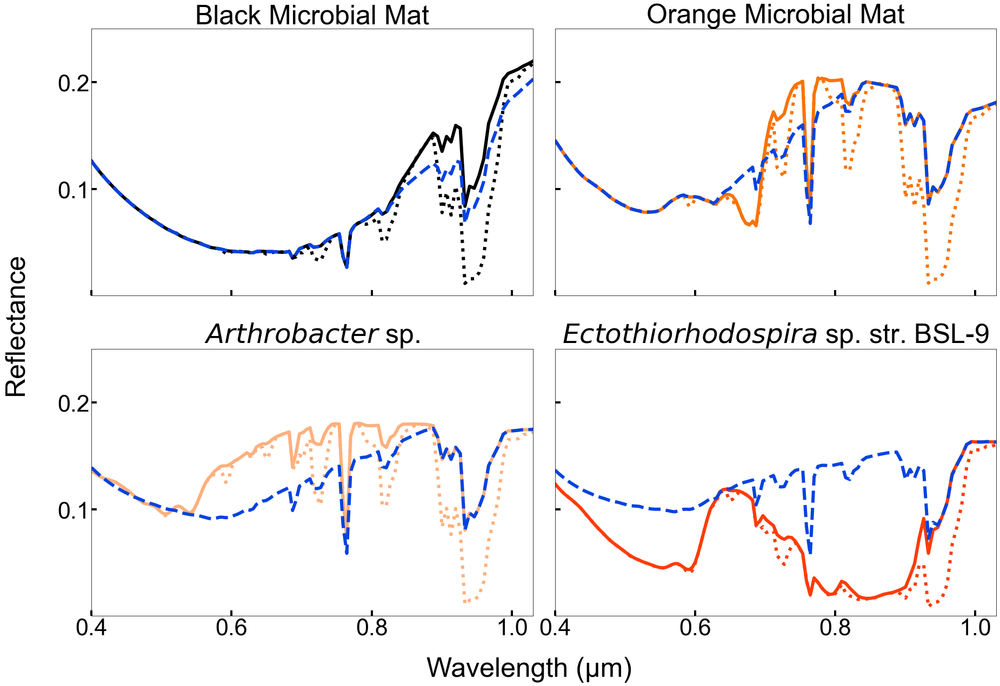

In [16]:
########################################################################################
## Plotting SMART spectra of microbes at clear skies with a low water vapor atmosphere##
########################################################################################


#Biological and abiologic clear sky low water vapor spectra 

font = {'fontname':'Arial'}

fig, axs = plt.subplots(2, 2)
fig.set_size_inches(30, 20)
fig.set_facecolor('white')
plt.subplots_adjust(hspace=0.2, wspace=0.05)
fig.supxlabel('Wavelength (' + u'\u03bc' + 'm)', fontsize = 50, x=0.5, y=0.04, **font)
fig.supylabel('Reflectance', fontsize = 50, x=0.05, y=0.5, **font)
xlim=(0.4,1.030)
ylim=(0,0.25)
plt.setp(axs, xlim=xlim, ylim=ylim)
legparams = font_manager.FontProperties(family = 'Arial', size = 40)


# Black mat
axs[0,0].plot(downspec(black_clear[1], black_clear[0])[0], downspec(black_clear[1], black_clear[0])[1],\
              'xkcd:black',linewidth=6, ls = 'dotted', label = 'Biotic Earth Atm.')
axs[0,0].plot(downspec(black_lowh2o[1], black_lowh2o[0])[0], downspec(black_lowh2o[1], black_lowh2o[0])[1],\
              'xkcd:black', linewidth=6, label = 'Biotic Dry Atm.')
axs[0,0].plot(downspec(bscrub_lowh2o[1], bscrub_lowh2o[0])[0], downspec(bscrub_lowh2o[1], bscrub_lowh2o[0])[1],\
              'xkcd:blue',linewidth=6, ls = 'dashed', label = 'Abiotic Dry Atm.')
axs[0,0].set_title('Black Microbial Mat', fontsize = 50, **font)
axs[0,0].tick_params(axis='both', direction='in', length=10, width=4, labelsize=43)
axs[0,0].axvspan(xmin=0.83, xmax=1.03, facecolor='xkcd:grey', alpha=0.15)
axs[0,0].set_yticks(np.arange(0.1, 0.25, step=0.1))
axs[0,0].set_xticks(np.arange(0.4, 1.03, step=0.2))
#axs[0,0].legend(fontsize = 40, ncol=1, prop = legparams, frameon=False, loc = 'upper left')
for tick in axs[0,0].get_xticklabels():
    tick.set_fontname("Arial")
for tick in axs[0,0].get_yticklabels():
    tick.set_fontname("Arial")
axs[0,0].xaxis.set_ticklabels([])

# Orange mat
axs[0,1].plot(downspec(orange_clear[1], orange_clear[0])[0], downspec(orange_clear[1], orange_clear[0])[1],\
              'xkcd:orange',linewidth=6, ls = 'dotted', label = 'Biotic Earth Atm.')
axs[0,1].plot(downspec(orange_lowh2o[1], orange_lowh2o[0])[0], downspec(orange_lowh2o[1], orange_lowh2o[0])[1],\
              'xkcd:orange', linewidth=6, label = 'Biotic Dry Atm.')
axs[0,1].plot(downspec(oscrub_lowh2o[1], oscrub_lowh2o[0])[0], downspec(oscrub_lowh2o[1], oscrub_lowh2o[0])[1],\
              'xkcd:blue',linewidth=6, ls = 'dashed', label = 'Abiotic Dry Atm.')
axs[0,1].set_title('Orange Microbial Mat', fontsize = 50, **font)
axs[0,1].tick_params(axis='both', direction='in',length=10, width=4, labelsize=43)
axs[0,1].axvspan(xmin=0.64, xmax=0.81, facecolor='xkcd:grey', alpha=0.15)
axs[0,1].set_yticks(np.arange(0.1, 0.25, step=0.1))
axs[0,1].set_xticks(np.arange(0.4, 1.03, step=0.2))
#axs[0,1].legend(fontsize = 40, ncol=1, prop = legparams, frameon=False, loc = 'upper left')
for tick in axs[0,1].get_xticklabels():
    tick.set_fontname("Arial")
for tick in axs[0,1].get_yticklabels():
    tick.set_fontname("Arial")
axs[0,1].yaxis.set_ticklabels([])
axs[0,1].xaxis.set_ticklabels([])

# Arthrobacter
axs[1,0].plot(downspec(arthro_clear[1], arthro_clear[0])[0], downspec(arthro_clear[1], arthro_clear[0])[1],\
              'xkcd:peach',linewidth=6, ls= 'dotted', label = 'Biotic Earth Atm.')
axs[1,0].plot(downspec(arthro_lowh2o[1], arthro_lowh2o[0])[0], downspec(arthro_lowh2o[1], arthro_lowh2o[0])[1],\
              'xkcd:peach',linewidth=6, label = 'Biotic Dry Atm.')
axs[1,0].plot(downspec(ascrub_lowh2o[1], ascrub_lowh2o[0])[0], downspec(ascrub_lowh2o[1], ascrub_lowh2o[0])[1],\
              'xkcd:blue',linewidth=6, ls= 'dashed', label = 'Abiotic Dry Atm.')
axs[1,0].set_title('$\it{Arthrobacter}$ sp.', fontsize = 50, **font)
axs[1,0].tick_params(axis='both', direction='in', length=10, width=4, labelsize=43)
axs[1,0].axvspan(xmin=0.54, xmax=0.81, facecolor='xkcd:grey', alpha=0.15)
axs[1,0].set_yticks(np.arange(0.1, 0.25, step=0.1))
axs[1,0].set_xticks(np.arange(0.4, 1.03, step=0.2))
#axs[1,0].legend(fontsize = 40, ncol=1, prop = legparams, frameon=False, loc = 'upper left')
for tick in axs[1,0].get_xticklabels():
    tick.set_fontname("Arial")
for tick in axs[1,0].get_yticklabels():
    tick.set_fontname("Arial")

# Ectothiorhodospira
axs[1,1].plot(downspec(ecto_clear[1], ecto_clear[0])[0], downspec(ecto_clear[1], ecto_clear[0])[1],\
              'xkcd:red orange',linewidth=6, ls = 'dotted', label = 'Biotic Earth Atm.')
axs[1,1].plot(downspec(ecto_lowh2o[1], ecto_lowh2o[0])[0], downspec(ecto_lowh2o[1], ecto_lowh2o[0])[1],\
              'xkcd:red orange',linewidth=6, label = 'Biotic Dry Atm.')
axs[1,1].plot(downspec(escrub_lowh2o[1], escrub_lowh2o[0])[0], downspec(escrub_lowh2o[1], escrub_lowh2o[0])[1],\
              'xkcd:blue',linewidth=6, ls = 'dashed', label = 'Abiotic Dry Atm.')
axs[1,1].set_title('$\it{Ectothiorhodospira}$ sp. str. BSL-9', fontsize = 50, **font)
axs[1,1].tick_params(axis='both', direction='in',length=10, width=4, labelsize=43)
axs[1,1].axvspan(xmin=0.4, xmax=0.93, facecolor='xkcd:grey', alpha=0.15)
axs[1,1].set_yticks(np.arange(0.1, 0.25, step=0.1))
axs[1,1].set_xticks(np.arange(0.4, 1.03, step=0.2))
#axs[1,1].legend(fontsize = 40, ncol=1, prop = legparams, frameon=False, loc = 'upper left')
for tick in axs[1,1].get_xticklabels():
    tick.set_fontname("Arial")
for tick in axs[1,1].get_yticklabels():
    tick.set_fontname("Arial")
axs[1,1].yaxis.set_ticklabels([])

plt.savefig('/Users/schuylerraeschroerborges/Downloads/Surface_biosignature_fig8.eps', format='eps')

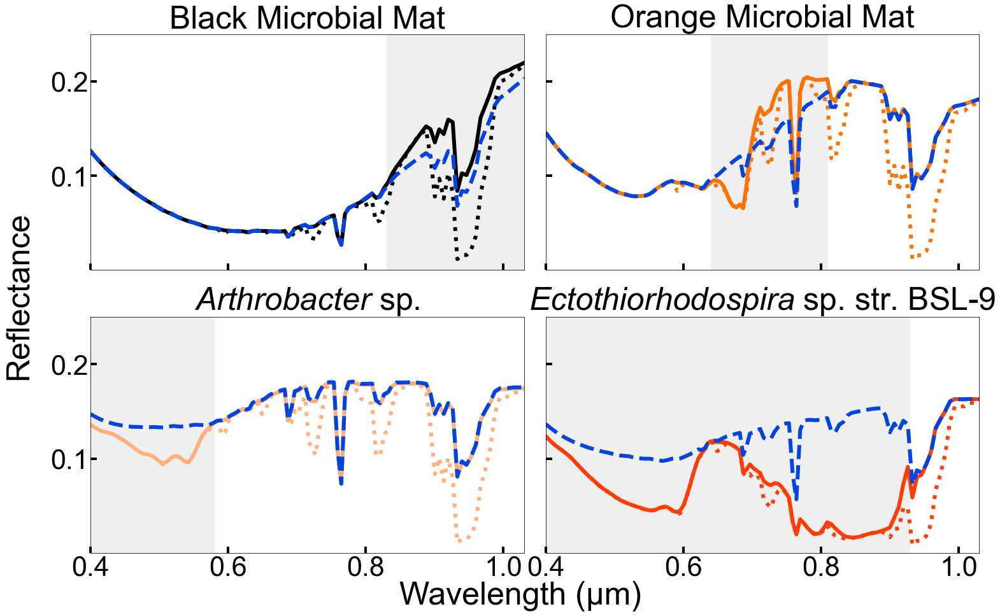

In [7]:
########################################################################################
## Plotting SMART spectra of microbes at clear skies with a low water vapor atmosphere##
########################################################################################


#Biological and abiologic clear sky low water vapor spectra 

font = {'fontname':'Arial'}
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['mathtext.it']= 'Arial:italic'
plt.rcParams['mathtext.cal']= 'Arial:italic'
plt.rcParams['mathtext.default'] = 'regular'
plt.rcParams["mathtext.fontset"] = 'custom'

fig, axs = plt.subplots(2, 2)
fig.set_size_inches(30, 20)
fig.set_facecolor('white')
plt.subplots_adjust(hspace=0.2, wspace=0.05)
fig.supxlabel('Wavelength (' + u'\u03bc' + 'm)', fontsize = 50, x=0.5, y=0.04, **font)
fig.supylabel('Reflectance', fontsize = 50, x=0.05, y=0.5, **font)
xlim=(0.4,1.030)
ylim=(0,0.25)
plt.setp(axs, xlim=xlim, ylim=ylim)
legparams = font_manager.FontProperties(family = 'Arial', size = 40)


# Black mat
axs[0,0].plot(downspec(black_clear[1], black_clear[0])[0], downspec(black_clear[1], black_clear[0])[1],\
              'xkcd:black',linewidth=6, ls = 'dotted', label = 'Biotic Earth Atm.')
axs[0,0].plot(downspec(black_lowh2o[1], black_lowh2o[0])[0], downspec(black_lowh2o[1], black_lowh2o[0])[1],\
              'xkcd:black', linewidth=6, label = 'Biotic Dry Atm.')
axs[0,0].plot(downspec(bscrub_lowh2o[1], bscrub_lowh2o[0])[0], downspec(bscrub_lowh2o[1], bscrub_lowh2o[0])[1],\
              'xkcd:blue',linewidth=6, ls = 'dashed', label = 'Abiotic Dry Atm.')
axs[0,0].set_title('Black Microbial Mat', fontsize = 50, **font)
axs[0,0].tick_params(axis='both', direction='in', length=10, width=4, labelsize=43)
axs[0,0].axvspan(xmin=0.83, xmax=1.03, facecolor='xkcd:grey', alpha=0.15)
axs[0,0].set_yticks(np.arange(0.1, 0.25, step=0.1))
axs[0,0].set_xticks(np.arange(0.4, 1.03, step=0.2))
#axs[0,0].legend(fontsize = 40, ncol=1, prop = legparams, frameon=False, loc = 'upper left')
for tick in axs[0,0].get_xticklabels():
    tick.set_fontname("Arial")
for tick in axs[0,0].get_yticklabels():
    tick.set_fontname("Arial")
axs[0,0].xaxis.set_ticklabels([])

# Orange mat
axs[0,1].plot(downspec(orange_clear[1], orange_clear[0])[0], downspec(orange_clear[1], orange_clear[0])[1],\
              'xkcd:orange',linewidth=6, ls = 'dotted', label = 'Biotic Earth Atm.')
axs[0,1].plot(downspec(orange_lowh2o[1], orange_lowh2o[0])[0], downspec(orange_lowh2o[1], orange_lowh2o[0])[1],\
              'xkcd:orange', linewidth=6, label = 'Biotic Dry Atm.')
axs[0,1].plot(downspec(oscrub_lowh2o[1], oscrub_lowh2o[0])[0], downspec(oscrub_lowh2o[1], oscrub_lowh2o[0])[1],\
              'xkcd:blue',linewidth=6, ls = 'dashed', label = 'Abiotic Dry Atm.')
axs[0,1].set_title('Orange Microbial Mat', fontsize = 50, **font)
axs[0,1].tick_params(axis='both', direction='in',length=10, width=4, labelsize=43)
axs[0,1].axvspan(xmin=0.64, xmax=0.81, facecolor='xkcd:grey', alpha=0.15)
axs[0,1].set_yticks(np.arange(0.1, 0.25, step=0.1))
axs[0,1].set_xticks(np.arange(0.4, 1.03, step=0.2))
#axs[0,1].legend(fontsize = 40, ncol=1, prop = legparams, frameon=False, loc = 'upper left')
for tick in axs[0,1].get_xticklabels():
    tick.set_fontname("Arial")
for tick in axs[0,1].get_yticklabels():
    tick.set_fontname("Arial")
axs[0,1].yaxis.set_ticklabels([])
axs[0,1].xaxis.set_ticklabels([])

# Arthrobacter
axs[1,0].plot(downspec(arthro_clear[1], arthro_clear[0])[0], downspec(arthro_clear[1], arthro_clear[0])[1],\
              'xkcd:peach',linewidth=6, ls= 'dotted', label = 'Biotic Earth Atm.')
axs[1,0].plot(downspec(arthro_lowh2o[1], arthro_lowh2o[0])[0], downspec(arthro_lowh2o[1], arthro_lowh2o[0])[1],\
              'xkcd:peach',linewidth=6, label = 'Biotic Dry Atm.')
axs[1,0].plot(downspec(ascrub_2_lowh2o[1], ascrub_2_lowh2o[0])[0], downspec(ascrub_2_lowh2o[1], ascrub_2_lowh2o[0])[1],\
              'xkcd:blue',linewidth=6, ls= 'dashed', label = 'Abiotic Dry Atm.')
axs[1,0].set_title('$\it{Arthrobacter}$ sp.', fontsize = 50, **font)
axs[1,0].tick_params(axis='both', direction='in', length=10, width=4, labelsize=43)
axs[1,0].axvspan(xmin=0.35, xmax=0.58, facecolor='xkcd:grey', alpha=0.15)
axs[1,0].set_yticks(np.arange(0.1, 0.25, step=0.1))
axs[1,0].set_xticks(np.arange(0.4, 1.03, step=0.2))
#axs[1,0].legend(fontsize = 40, ncol=1, prop = legparams, frameon=False, loc = 'upper left')
for tick in axs[1,0].get_xticklabels():
    tick.set_fontname("Arial")
for tick in axs[1,0].get_yticklabels():
    tick.set_fontname("Arial")

# Ectothiorhodospira
axs[1,1].plot(downspec(ecto_clear[1], ecto_clear[0])[0], downspec(ecto_clear[1], ecto_clear[0])[1],\
              'xkcd:red orange',linewidth=6, ls = 'dotted', label = 'Biotic Earth Atm.')
axs[1,1].plot(downspec(ecto_lowh2o[1], ecto_lowh2o[0])[0], downspec(ecto_lowh2o[1], ecto_lowh2o[0])[1],\
              'xkcd:red orange',linewidth=6, label = 'Biotic Dry Atm.')
axs[1,1].plot(downspec(escrub_lowh2o[1], escrub_lowh2o[0])[0], downspec(escrub_lowh2o[1], escrub_lowh2o[0])[1],\
              'xkcd:blue',linewidth=6, ls = 'dashed', label = 'Abiotic Dry Atm.')
axs[1,1].set_title('$\it{Ectothiorhodospira}$ sp. str. BSL-9', fontsize = 50, **font)
axs[1,1].tick_params(axis='both', direction='in',length=10, width=4, labelsize=43)
axs[1,1].axvspan(xmin=0.4, xmax=0.93, facecolor='xkcd:grey', alpha=0.15)
axs[1,1].set_yticks(np.arange(0.1, 0.25, step=0.1))
axs[1,1].set_xticks(np.arange(0.4, 1.03, step=0.2))
#axs[1,1].legend(fontsize = 40, ncol=1, prop = legparams, frameon=False, loc = 'upper left')
for tick in axs[1,1].get_xticklabels():
    tick.set_fontname("Arial")
for tick in axs[1,1].get_yticklabels():
    tick.set_fontname("Arial")
axs[1,1].yaxis.set_ticklabels([])

plt.savefig('/Users/schuylerraeschroerborges/Downloads/Figure8.tif', format='tif')